In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
import time
import string
from joblib import dump, load

import numpy as np
from scipy.misc import imread, imsave, imresize

from tqdm import tqdm

from joblib import load

In [3]:
import seaborn as sns

ModuleNotFoundError: No module named 'seaborn'

In [5]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

In [27]:
single_models = ['carb96558.jbl', 
                 'SoilB-2.jbl', 
                 'Urna_22.jbl',
                ]
double_models = ['carb96558_SoilB-2.jbl', 
                 'carb96558_Urna_22.jbl', 
                 'SoilB-2_Urna_22.jbl',
                 ]
triple_models = ['SoilB-2_Urna_22_carb96558.jbl']

models = single_models + double_models + triple_models

carb_stacks = ['carb71', 'carb96558', 'carbRNF', 'SPE_carb10_58_box3']
soil_stacks = ['SoilAh-1', 'SoilB-2', 'TeTree_subset1', 'TiTree_subset2']
urna_stacks = ['Urna_22', 'Urna_30', 'Urna_34']

stacks_name_mapping = {
    'carb96558': 'carbonate 1',
    'carb71': 'carbonate 2',
    'carbRNF': 'carbonate 3',
    'SPE_carb10_58_box3': 'carbonate 4',
    'SoilAh-1': 'soil 2',
    'SoilB-2': 'soil 1',
    'TeTree_subset1': 'soil 3',
    'TiTree_subset2': 'soil 4',
    'Urna_22': 'sandstone 1', 
    'Urna_30': 'sandstone 2',
    'Urna_34': 'sandstone 3',
}
stacks = carb_stacks + soil_stacks + urna_stacks

In [20]:
from article_graphics import plot_polar, plot_thresholded_metric

ModuleNotFoundError: No module named 'article_graphics'

In [5]:
metrics = ['iou', 'precision', 'recall', 'accuracy']
metrics_th = ['iou']

In [6]:
from itertools import chain

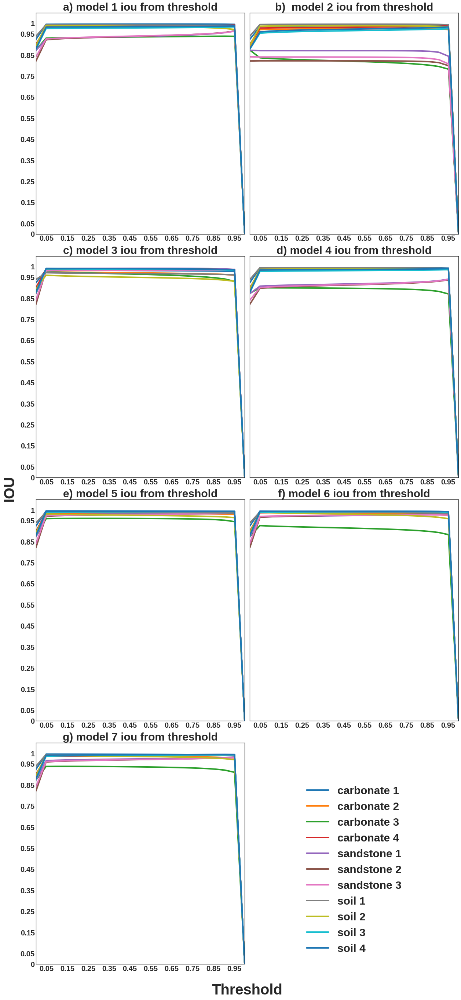

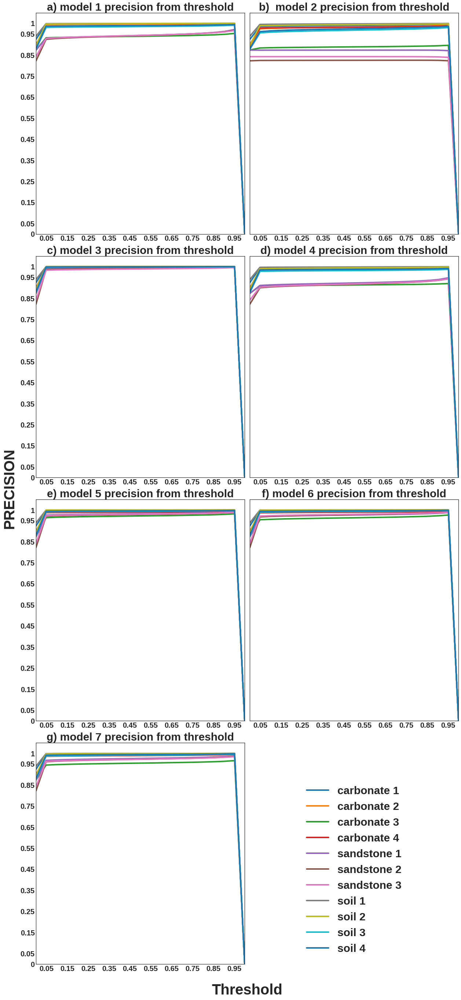

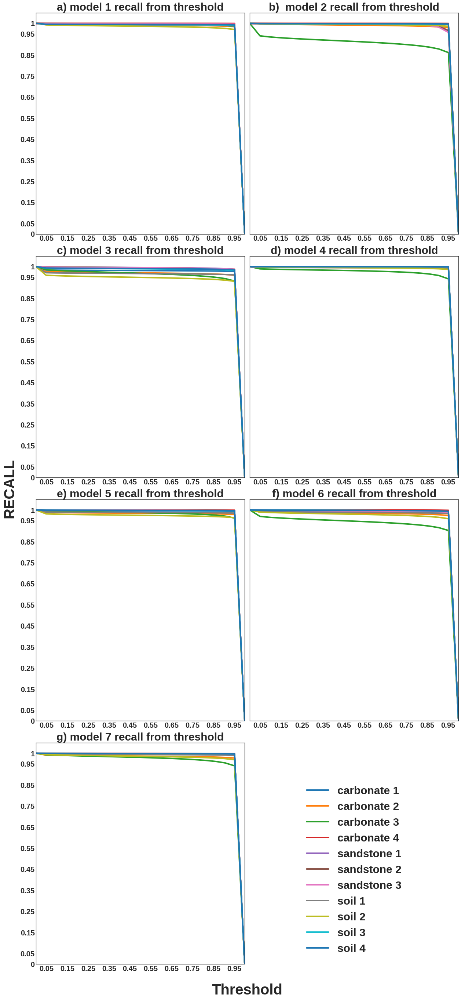

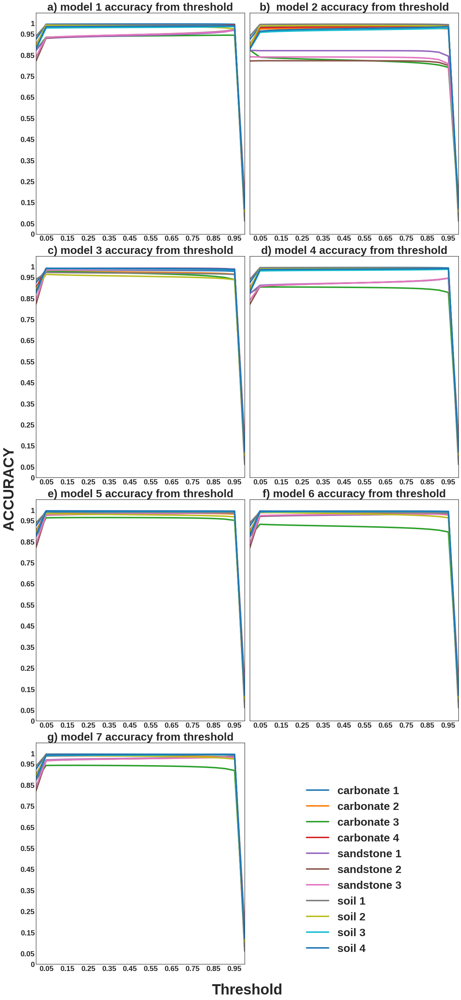

In [8]:
for metric_th in metrics:
    plot_thresholded_metric(models, [metric_th], 4, 2)

In [4]:
import pickle

In [5]:
import pandas as pd

In [10]:
with open('../output_data/results/results.pickle', 'rb') as f:
    data = pickle.load(f)

In [11]:
exp_results = []
for p in os.listdir('./experiments'):
    if '.' in p:
        continue
    for f in os.listdir(os.path.join('./experiments', p)):
        if f.endswith('.pkl'):
            exp_results.append(os.path.join('./experiments', p, f))

In [30]:
exp_results

['./experiments/carb96558_soilB_2_exp/carb96558_soilB-2_exp_results.pkl',
 './experiments/soilB_2_Urna_22_exp/SoilB-2_Urna_22_exp_results.pkl',
 './experiments/carb96558_Urna_22_exp/carb96558_Urna_22_exp_results.pkl',
 './experiments/carb96558_soilB_2_Urna_22_exp/carb96558_SoilB-2_Urna_22_exp_results.pkl',
 './experiments/carb96558_exp/carb96558_exp_results.pkl',
 './experiments/carbRNF_dim1_train_dim2_test_exp/carbRNF_dim1_train_dim2_test_exp_exp_results.pkl',
 './experiments/soilB_2_exp/SoilB-2_exp_results.pkl',
 './experiments/carbRNF_dim2_train_dim2_test_exp/carbRNF_dim2_train_dim2_test_exp_exp_results.pkl',
 './experiments/Urna_22_exp/Urna_22_exp_results.pkl',
 './experiments/carbRNF_dim0_train_dim2_test_exp/carbRNF_dim0_train_dim2_test_exp_exp_results.pkl']

In [32]:
exp_results = [
 './experiments/carb96558_soilB_2_exp/carb96558_soilB-2_exp_results.pkl',
 './experiments/soilB_2_Urna_22_exp/SoilB-2_Urna_22_exp_results.pkl',
 './experiments/carb96558_Urna_22_exp/carb96558_Urna_22_exp_results.pkl',
 './experiments/carb96558_soilB_2_Urna_22_exp/carb96558_SoilB-2_Urna_22_exp_results.pkl',
 './experiments/carb96558_exp/carb96558_exp_results.pkl',
 './experiments/soilB_2_exp/SoilB-2_exp_results.pkl',
 './experiments/Urna_22_exp/Urna_22_exp_results.pkl',
]

In [33]:
def make_df(data, model_name):
    metrics_list = ['accuracy', 'precision', 'recall', 'f1', 'pr_auc', 'iou']
    data = data['test_metrics']
    records = []
    for s, v in data.items():
        if s in metrics_list:
            continue
        stack_name = s.split('/')[-1]
        record = {k: v[k][-1] for k in metrics_list}
        record['stack'] = stack_name
        record['model'] = model_name
        records.append(record)
    return pd.DataFrame.from_records(records)

In [34]:
df = []
for exp in exp_results:
    model_name = exp.split('/')[-1][:-len('_exp_results.pkl')]
    with open(exp, 'rb') as f:
        data = pickle.load(f)
    df.append(make_df(data, model_name=model_name))
df = pd.concat(df)

In [50]:
stack

'Urna_34'

In [48]:
for stack in pd.unique(df['stack']):
    stack_df = df[df['stack'] == stack].sort_values(by='iou', ascending=False)
    stack_df = stack_df.drop('stack', axis=1)
    stack_df.to_csv('article_results/{}.csv'.format(stack))

In [40]:
for stack in pd.unique(df['stack']):
    df[df.stack == stack].to_csv('article_results/{}.')

array(['carb96558', 'carb71', 'carbRNF', 'SPE_carb10_58_box3', 'SoilAh-1',
       'SoilB-2', 'TeTree_subset1', 'TiTree_subset2', 'Urna_22',
       'Urna_30', 'Urna_34'], dtype=object)

In [35]:
df

,accuracy,f1,iou,model,pr_auc,precision,recall,stack
0,0.996496,0.998103,0.996213,carb96558_soilB-2,0.999989,0.998032,0.998174,carb96558
1,0.989207,0.993815,0.987707,carb96558_soilB-2,0.999900,0.997820,0.989843,carb71
2,0.985138,0.991981,0.984090,carb96558_soilB-2,0.999836,0.985638,0.998406,carbRNF
3,0.993484,0.996502,0.993029,carb96558_soilB-2,0.999984,0.993143,0.999885,SPE_carb10_58_box3
4,0.992818,0.996209,0.992447,carb96558_soilB-2,0.999955,0.993919,0.998509,SoilAh-1
5,0.996778,0.998320,0.996646,carb96558_soilB-2,0.999990,0.997988,0.998652,SoilB-2
6,0.989136,0.993867,0.987809,carb96558_soilB-2,0.999917,0.988512,0.999281,TeTree_subset1
7,0.992231,0.995586,0.991211,carb96558_soilB-2,0.999959,0.991873,0.999327,TiTree_subset2
8,0.992063,0.995534,0.991108,carb96558_soilB-2,0.999937,0.996271,0.994798,Urna_22
9,0.990316,0.994247,0.988560,carb96558_soilB-2,0.999908,0.996237,0.992266,Urna_30


In [36]:
from visualization_utils import plot_polar

In [37]:
models_name_mapping = {
   'carb96558': 'model 1',
   'SoilB-2': ' model 2',
   'Urna_22': 'model 3',
   'carb96558_soilB-2': 'model 4',
   'carb96558_Urna_22': 'model 5',
   'SoilB-2_Urna_22': 'model 6',
   'carb96558_SoilB-2_Urna_22': 'model 7',
}


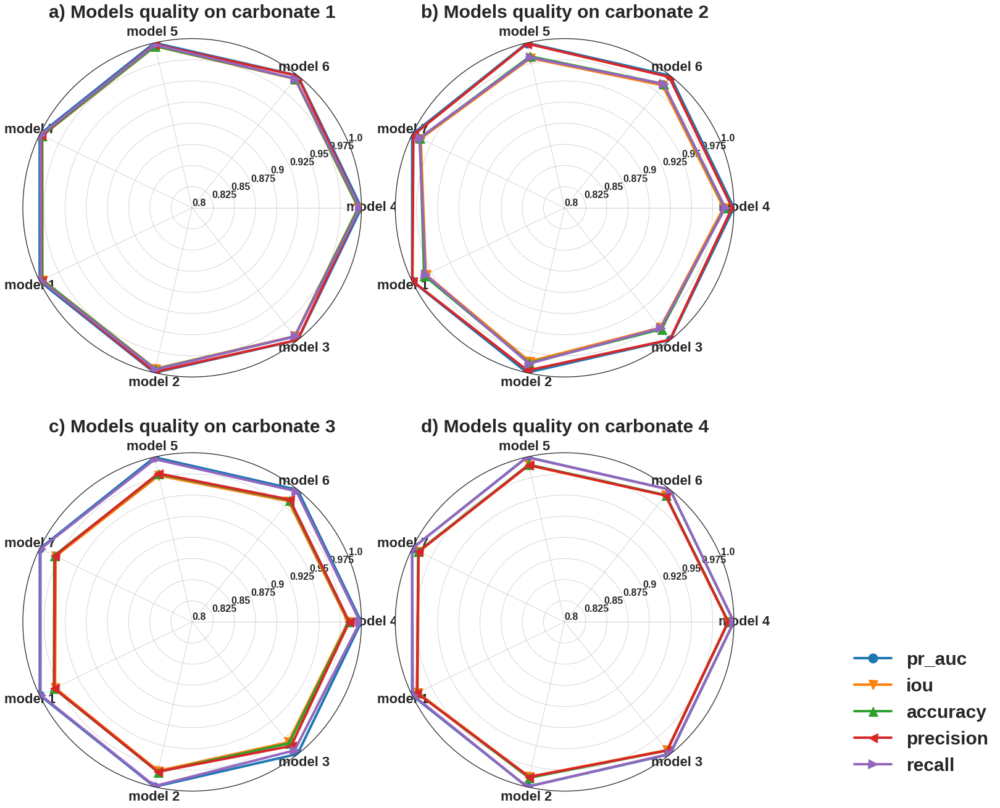

In [38]:
markers = ['o', 'v', '^', '<', '>']
plot_polar('carb',
           models, 
           carb_stacks,
           ['pr_auc', 'iou', 'accuracy', 'precision', 'recall'], 
           df,
           stacks_name_mapping,
           models_name_mapping,
           markers,
           2, 2)

In [12]:
data

,logloss,PR-AUC,iou,accuracy,precision,recall,Model,Stack
0,0.062592,0.999868,0.988347,0.989660,0.994815,0.993462,carb96558,carb71
1,0.085580,0.999266,0.971950,0.974653,0.976784,0.994929,SoilB-2,carb71
2,0.251371,0.999198,0.974023,0.977063,0.999595,0.974408,Urna_22,carb71
3,0.042091,0.999890,0.988228,0.989520,0.991696,0.996469,carb96558_SoilB-2,carb71
4,0.124828,0.999721,0.984698,0.986467,0.997661,0.986981,carb96558_Urna_22,carb71
5,0.098208,0.999845,0.986319,0.987901,0.997684,0.988587,SoilB-2_Urna_22,carb71
6,0.084164,0.999862,0.987192,0.988668,0.997423,0.989718,SoilB-2_Urna_22_carb96558,carb71
0,0.009389,0.999990,0.995829,0.996133,0.996596,0.999230,carb96558,carb96558
1,0.035781,0.999860,0.985870,0.986765,0.986683,0.999166,SoilB-2,carb96558
2,0.176908,0.999866,0.982986,0.984277,0.999995,0.982994,Urna_22,carb96558


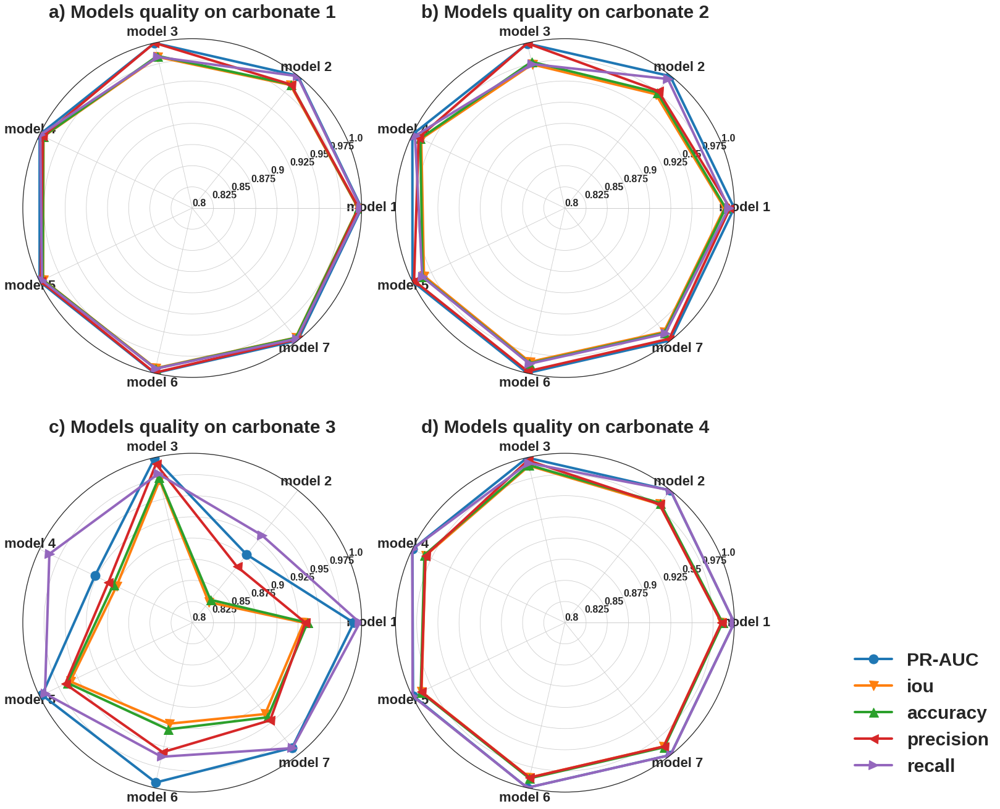

In [136]:
markers = ['o', 'v', '^', '<', '>']
plot_polar('carb',
           models, 
           carb_stacks,
           ['PR-AUC', 'iou', 'accuracy', 'precision', 'recall'], 
           data[data['Stack'].isin(carb_stacks)],
           2, 2)

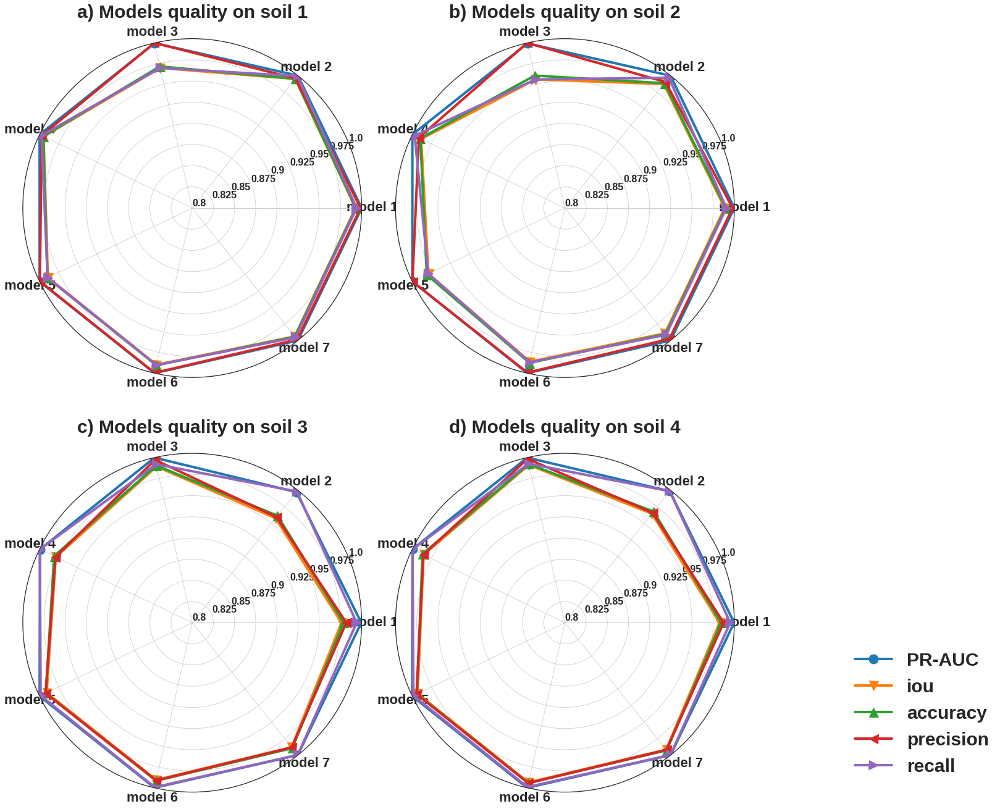

In [138]:
markers = ['o', 'v', '^', '<', '>']
plot_polar('soil',
           models,
           soil_stacks,
           ['PR-AUC', 'iou', 'accuracy', 'precision', 'recall'], 
           data[data['Stack'].isin(soil_stacks)],
           2, 2)

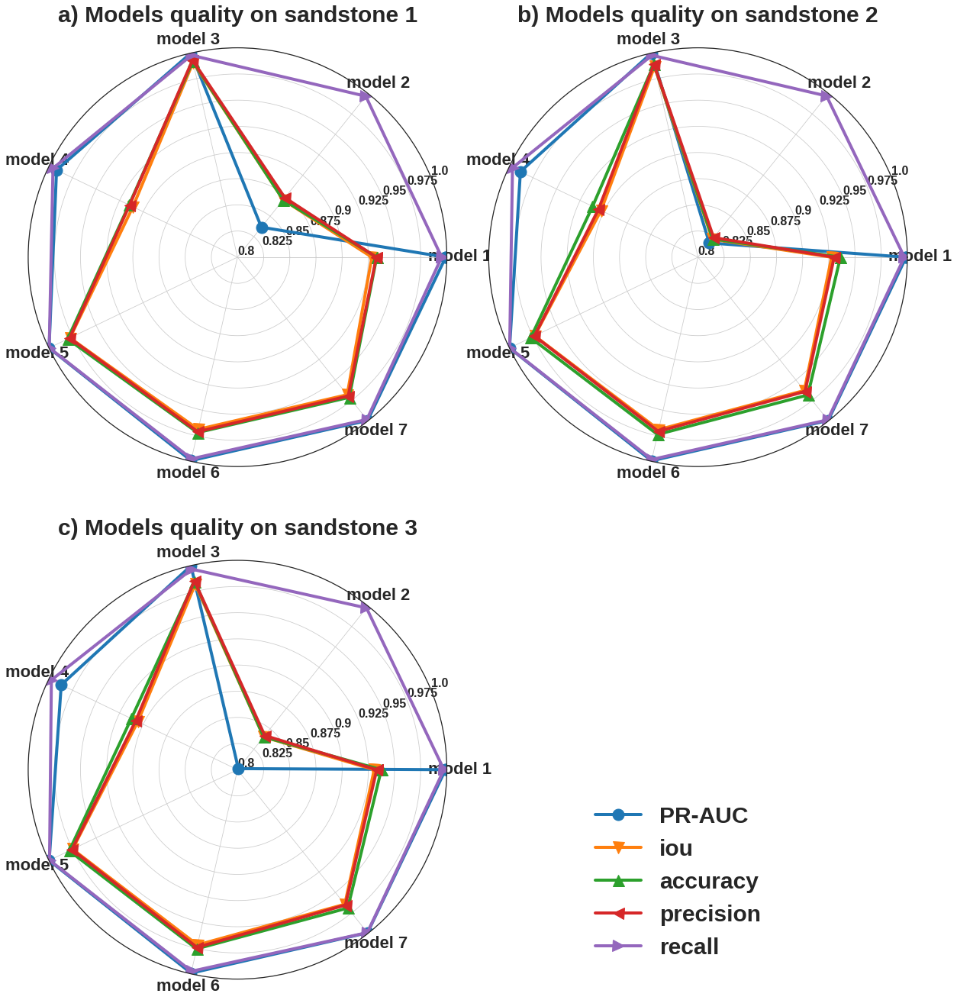

In [139]:
markers = ['o', 'v', '^', '<', '>']
plot_polar('sand',
           models,
           urna_stacks,
           ['PR-AUC', 'iou', 'accuracy', 'precision', 'recall'], 
           data[data['Stack'].isin(urna_stacks)],
           2, 2)

In [12]:
import matplotlib

In [40]:
def plot_samples(images, h, w, savename):
    plt.style.use('seaborn-white')
    fig_kw = {'figsize': (10 * w, 10 * h)}
    gridspec_kw = {#'nrows': h, 'ncols': 2 * w,
                   'left': 0.1, 'right': 0.9, 'bottom': 0.05, 'top': 0.95,
                   'wspace': 0.025, 'hspace': 0.1}
    suptitle_properties = {'weight': 'semibold', 'size': 50}
    title_properties = {'weight': 'semibold', 'size': 40}
    legend_properties = {'weight': 'semibold', 'size': 30}
    labels_properties = {'weight': 'semibold', 'size': 20}
    fig, axes = plt.subplots(h, w, sharey='row', #sharex='col', 
                             gridspec_kw=gridspec_kw, **fig_kw)
    
    axes = list(chain(*axes))
    
    images = sorted(images, key=lambda item: stacks_name_mapping[item.split('/')[-1].split('.')[0]])
    for i, (fname, axis) in enumerate(zip(images, axes)):
        image = matplotlib.pyplot.imread(fname)
        axis.imshow(image, cmap='gray')
        axis.set_xticks([])
        axis.set_yticks([])
        f = stacks_name_mapping[fname.split('/')[-1].split('.')[0]]
        axis.set_title(f, fontsize=24)

    if len(images) < len(axes):
        axes[-1].set_visible(False)
    plt.savefig('../output_data/results/' + savename)
    plt.show()

In [41]:
fold_path = '/home/efim/study/10_semester/course_work/all_data/binary_data'

In [42]:
files = [os.path.join(fold_path, fname) for fname in os.listdir(fold_path)]

In [43]:
carbs = [
    '/home/efim/study/10_semester/course_work/all_data/samples/carb71.bmp',
    '/home/efim/study/10_semester/course_work/all_data/samples/carbRNF.bmp',
    '/home/efim/study/10_semester/course_work/all_data/samples/SPE_carb10_58_box3.bmp',
    '/home/efim/study/10_semester/course_work/all_data/samples/carb96558.bmp',
]
sands = [
    '/home/efim/study/10_semester/course_work/all_data/samples/Urna_30.bmp',
    '/home/efim/study/10_semester/course_work/all_data/samples/Urna_34.bmp',
    '/home/efim/study/10_semester/course_work/all_data/samples/Urna_22.bmp',
]
soils = [
    '/home/efim/study/10_semester/course_work/all_data/samples/TiTree_subset2.bmp',
    '/home/efim/study/10_semester/course_work/all_data/samples/TeTree_subset1.bmp',
    '/home/efim/study/10_semester/course_work/all_data/samples/SoilB-2.bmp',
    '/home/efim/study/10_semester/course_work/all_data/samples/SoilAh-1.bmp'
]

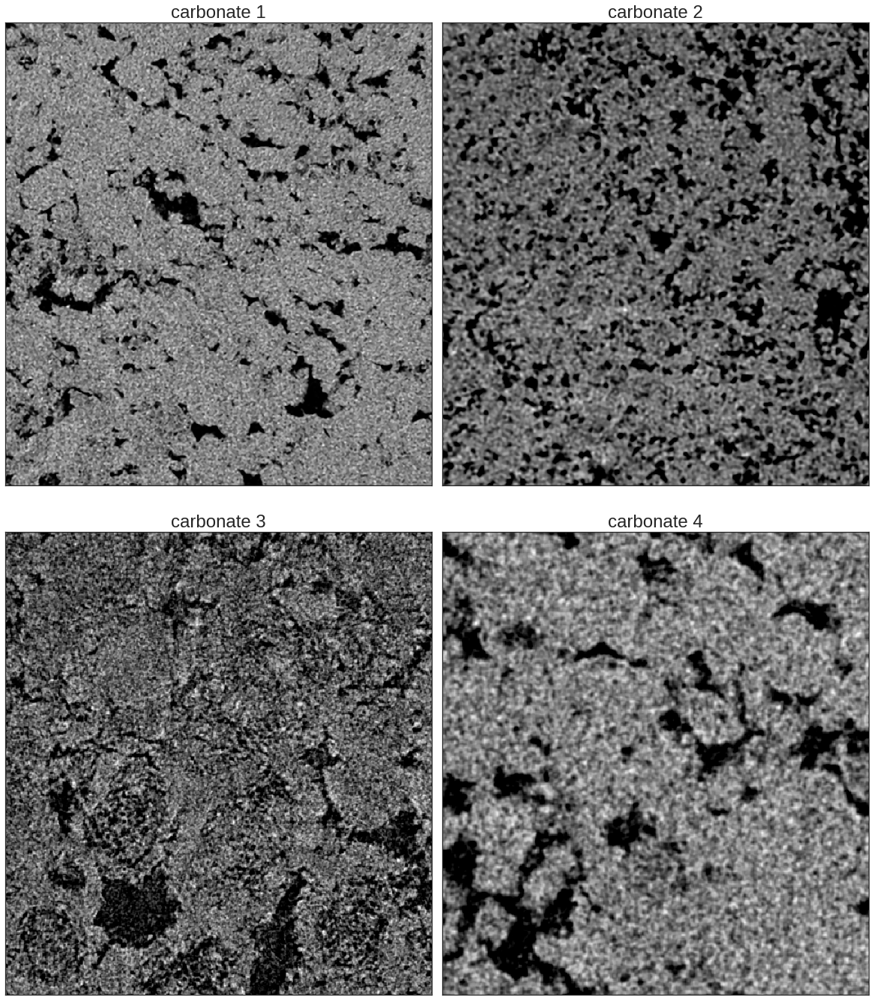

In [44]:
plot_samples(carbs, 2, 2, 'carbs.jpg')

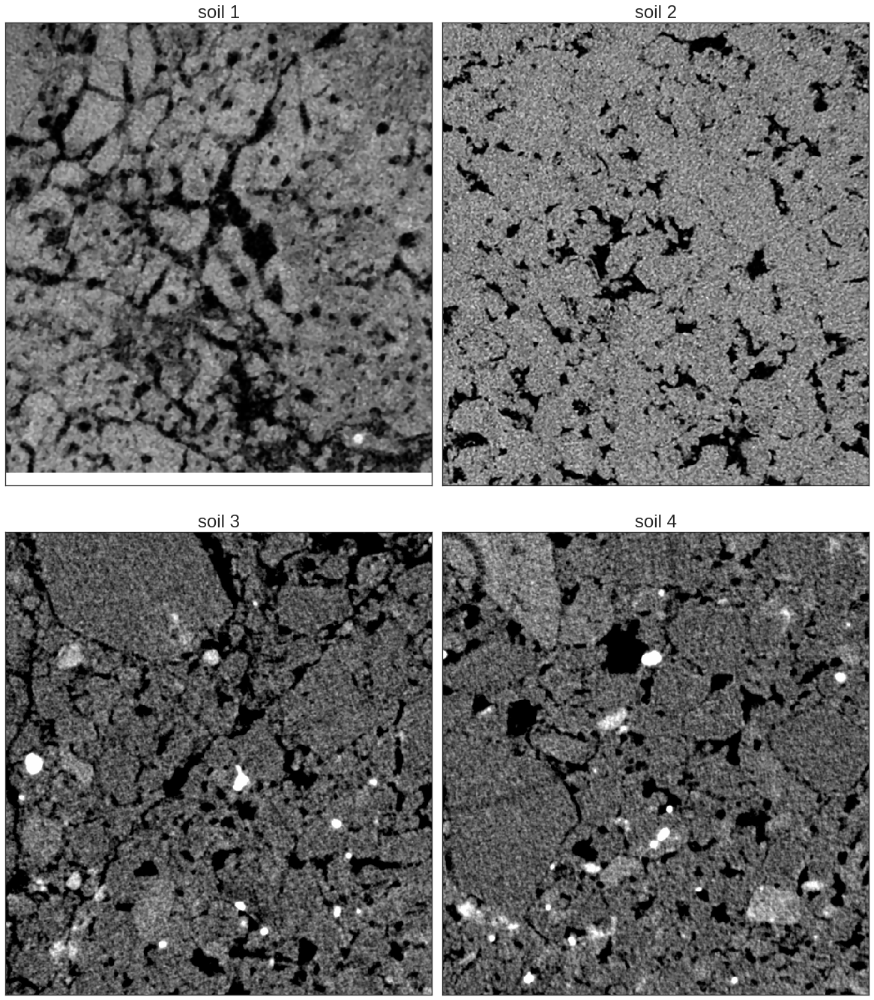

In [45]:
plot_samples(soils, 2, 2, 'soils.jpg')

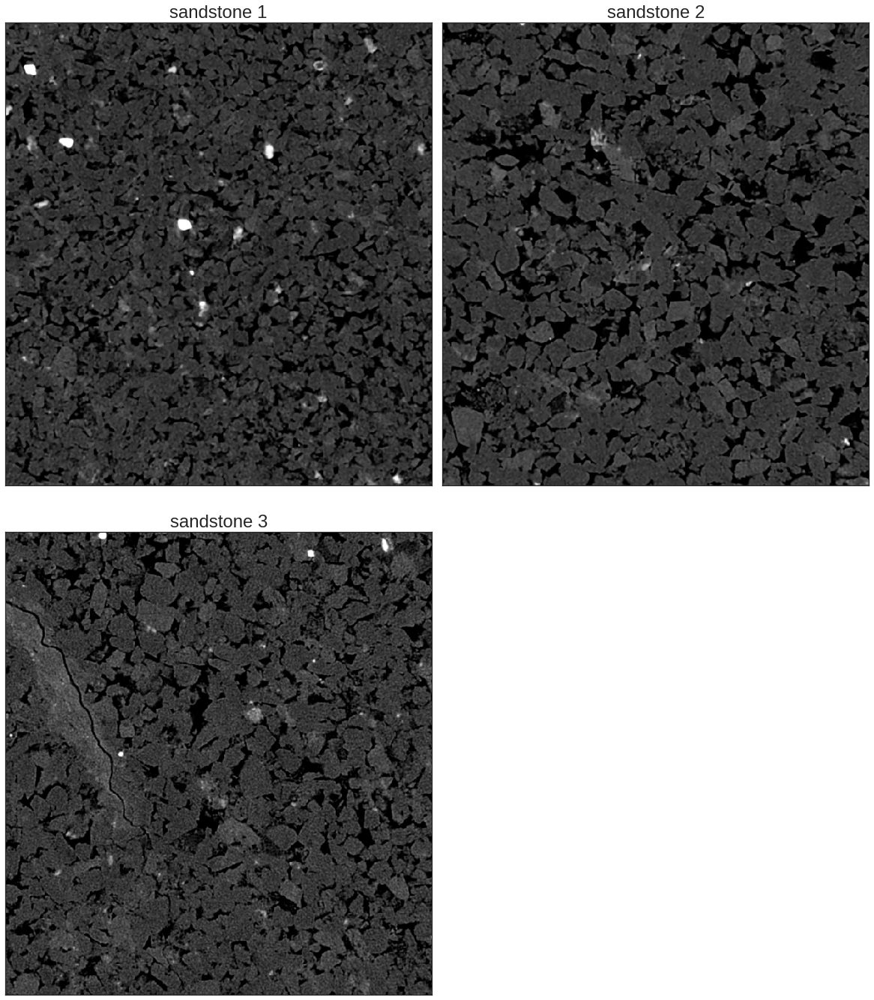

In [46]:
plot_samples(sands, 2, 2, 'sands.jpg')

In [131]:
stack

'carb96558'

In [130]:
results

,logloss,PR-AUC,iou,accuracy,precision,recall,Model,Stack


In [115]:
results[metric_name]

Series([], Name: PR-AUC, dtype: float64)

/usr/local/lib/python3.5/dist-packages/matplotlib/cbook/deprecation.py:106: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


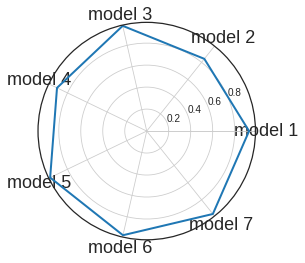

In [57]:
ax = plt.subplot(111, projection='polar')

results = data[data['Stack'] == 'Urna_34']
x = list(np.linspace(0, 2 * np.pi, len(results) + 1))
ax.set_xticks(x)
        
labels = [models_name_mapping[item] for item in results['Model']]
ax.set_xticklabels(labels, fontsize=18)

for metric_name in metrics_th:
    y = list(results[metric_name])
#             x.append(x[0])
    ax.plot(x, y + [y[0]], label=metric_name, linewidth=2)
plt.show()
ax.legend()

In [117]:
x

[0.0,
 0.8975979010256552,
 1.7951958020513104,
 2.6927937030769655,
 3.5903916041026207,
 4.487989505128276,
 5.385587406153931,
 6.283185307179586]

In [ ]:
# sphinx_gallery_thumbnail_number = 3
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize

In [ ]:
def normal_pdf(x, mean, var):
    return np.exp(-(x - mean)**2 / (2*var))

In [18]:
# Generate the space in which the blobs will live
xmin, xmax, ymin, ymax = (0, 100, 0, 100)
n_bins = 100
xx = np.linspace(xmin, xmax, n_bins)
yy = np.linspace(ymin, ymax, n_bins)

# Generate the blobs. The range of the values is roughly -.0002 to .0002
means_high = [20, 50]
means_low = [50, 60]
var = [150, 200]

gauss_x_high = normal_pdf(xx, means_high[0], var[0])
gauss_y_high = normal_pdf(yy, means_high[1], var[0])

gauss_x_low = normal_pdf(xx, means_low[0], var[1])
gauss_y_low = normal_pdf(yy, means_low[1], var[1])

weights_high = np.array(np.meshgrid(gauss_x_high, gauss_y_high)).prod(0)
weights_low = -1 * np.array(np.meshgrid(gauss_x_low, gauss_y_low)).prod(0)
weights = weights_high + weights_low

# We'll also create a grey background into which the pixels will fade
greys = np.empty(weights.shape + (3,), dtype=np.uint8)
greys.fill(70)

# First we'll plot these blobs using only ``imshow``.
vmax = np.abs(weights).max()
vmin = -vmax
cmap = plt.cm.RdYlBu

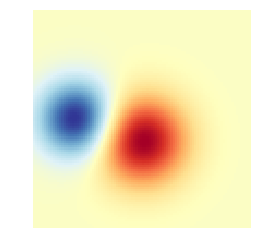

In [19]:
fig, ax = plt.subplots()
# ax.imshow(greys)
ax.imshow(weights, extent=(xmin, xmax, ymin, ymax), cmap=cmap)
ax.set_axis_off()
plt.show()

In [12]:
weights.shape

(100, 100)

In [17]:
xmin, xmax, ymin, ymax

(0, 100, 0, 100)